In [1]:
import tensorflow as tf

In [2]:
from collections import Counter

In [3]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from tensorflow import keras
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
import IPython.display as display
from PIL import Image

In [4]:
df = pd.read_csv('train.csv')

In [5]:
dir_path = "images"

In [6]:
list_of_train_data = []
for i in df.image_id:
    list_of_train_data.append(os.path.join(dir_path,i+".jpg"))

In [7]:
train_image_labels = []
for i in df.values:
    train_image_labels.append(np.where(i[1:]==1)[0][0])

In [8]:
##Getting image names
train_data = []
for i in df.image_id:
    train_data.append(i)

In [9]:
x_train, x_test, y_train, y_test = train_test_split(list_of_train_data, train_image_labels, test_size = 0.25, stratify = train_image_labels, random_state = 30)

In [10]:
def auc_score(y_true, y_pred):
    if len(np.unique(y_true[:,1])) == 1:
        return 0.5
    else:
        return roc_auc_score(y_true, y_pred)

In [11]:
#AUC score
def auc( y_true, y_pred ) :
    score = tf.py_function( auc_score,[y_true, y_pred],'float32',name='sklearnAUC' )
    return score

In [12]:
best_model = keras.models.load_model('best_model_efficientnetb4_agumented', custom_objects={'auc':auc})

In [13]:
def predictions(x_test):
    a = np.empty((0,4),float)
    for i in tqdm(x_test):
        image_string = tf.io.read_file(i)
        image = tf.image.decode_jpeg(image_string, channels=3)
        image = tf.image.convert_image_dtype(image, tf.float32)
        image = tf.image.resize(image, [204, 136])
        image = tf.expand_dims(image, axis=0)
        a = np.concatenate((a,best_model.predict(image)), axis=0)
    b = pd.DataFrame(a)
    image_names = [i.split("\\")[1].split(".")[0] for i in x_test]
    b['image_id'] = image_names
    b.columns= ['healthy', 'multiple_diseases', 'rust', 'scab', 'image_id'] # Naming the columns
    b = b[['image_id', 'healthy', 'multiple_diseases', 'rust', 'scab']] # Reodering the column
    b.set_index('image_id')
    return b

In [14]:
y_predictions = predictions(x_test)

100%|████████████████████████████████████████████████████████████████████████████████| 456/456 [01:22<00:00,  5.53it/s]


In [15]:
predicted_image_labels = []
for i in y_predictions.values:
    predicted_image_labels.append(np.argmax(i[1:]))

In [16]:
y_predictions['predicted'] = predicted_image_labels 
y_predictions['actual'] = y_test

# Studying all the Images which were wrongly predicted, that too with very high probability
# The cases when the model gave wrong answers, confidently

In [17]:
wrong_predictions = y_predictions[y_predictions['predicted'] != y_predictions['actual']]

In [18]:
labels = ['healthy', 'multiple_diseases', 'rust', 'scab']

In [19]:
wrong_predictions_with_high_confidence = []
for i in wrong_predictions.values:
    wrong_predictions_with_high_confidence.append(max(i[1:5])>=0.7)

In [20]:
wrong_with_confidence = wrong_predictions[wrong_predictions_with_high_confidence]

In [21]:
wrong_with_confidence.head()

,image_id,healthy,multiple_diseases,rust,scab,predicted,actual
15,Train_762,0.723107,0.079555,0.096995,0.100344,0,1
27,Train_1550,0.916563,0.022402,0.001587,0.059449,0,3
32,Train_1558,0.011871,0.079221,0.903973,0.004935,2,1
33,Train_1134,0.004175,0.035604,0.000278,0.959943,3,1
80,Train_418,0.033648,0.047065,0.902287,0.017000,2,1


In [22]:
import matplotlib.image as img

Predicted Class = healthy, Actual Class = multiple_diseases Train_762.jpg


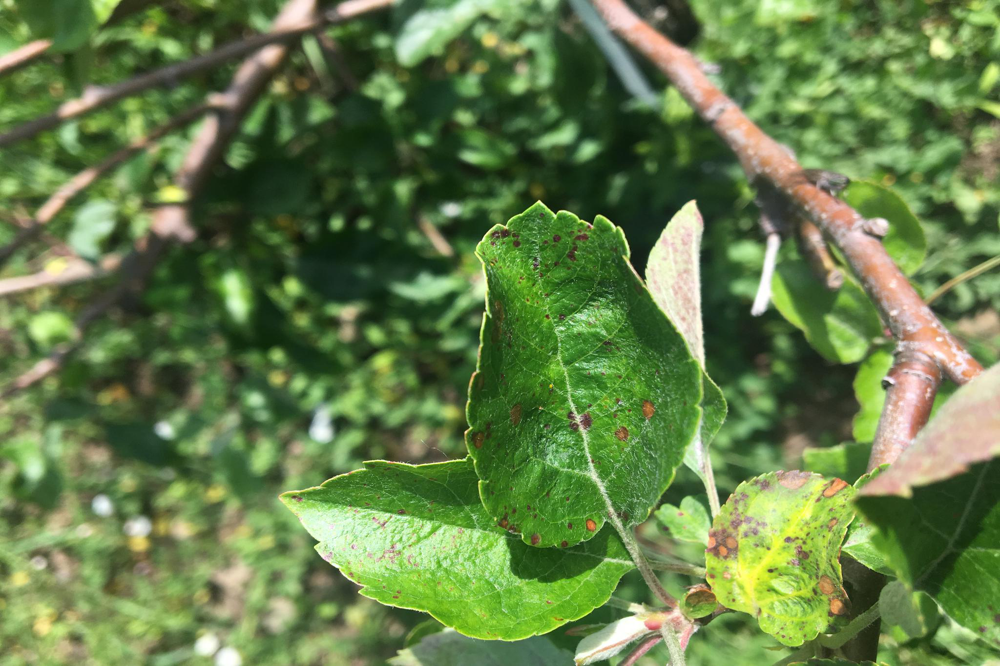

In [23]:
c = 0
for i in wrong_with_confidence.values:
    print("Predicted Class = "+ labels[i[5]] + ", Actual Class = "+labels[i[6]], i[0]+'.jpg')
    display.display(Image.open(os.path.join('images', i[0]+'.jpg')))
    break

# Studying all the Images which were Correctly predicted,  with very high probability
## The cases when the model gave the correct answers, confidently

In [24]:
correct_predictions = y_predictions[y_predictions['predicted'] == y_predictions['actual']]

In [25]:
labels = ['healthy', 'multiple_diseases', 'rust', 'scab']

In [26]:
correct_predictions_with_high_confidence = []
for i in correct_predictions.values:
    correct_predictions_with_high_confidence.append(max(i[1:5])>=0.9)

Predicted Class = rust, Actual Class = rust Train_156.jpg


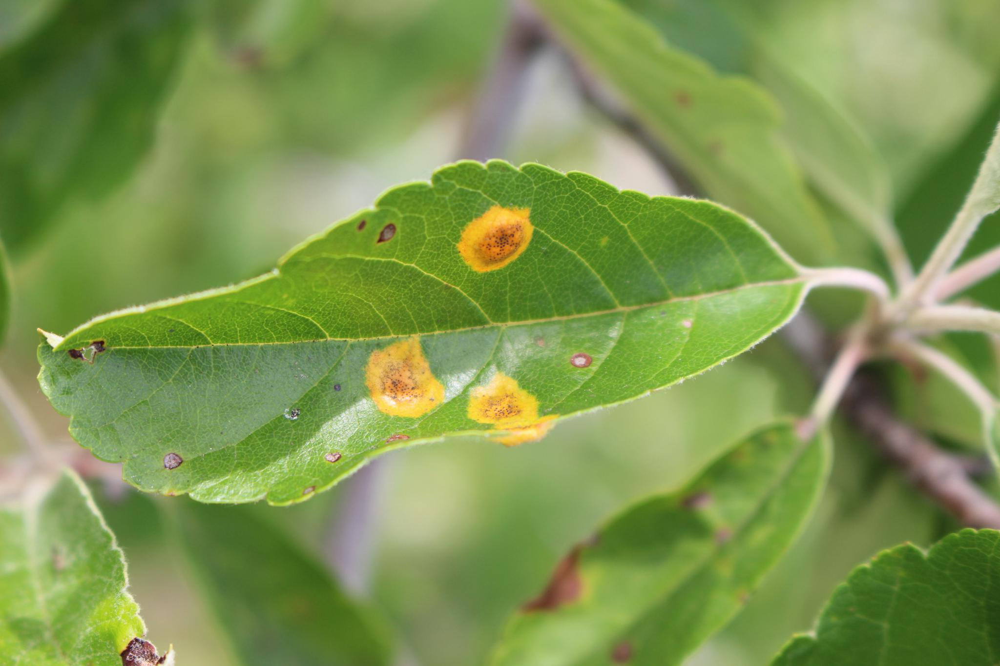

In [27]:
correct_with_confidence = correct_predictions[correct_predictions_with_high_confidence]
c = 0
for i in correct_with_confidence.values:
    c+=1
    print("Predicted Class = "+ labels[i[5]] + ", Actual Class = "+labels[i[6]]+" "+i[0]+'.jpg')
    display.display(Image.open(os.path.join('images', i[0]+'.jpg')))
    break

# Studying all the images which were predicted correctly but not with a very high probablity 
## The cases when the model gave rights answers but not very confidently

In [28]:
correct_predictions = y_predictions[y_predictions['predicted'] == y_predictions['actual']]
labels = ['healthy', 'multiple_diseases', 'rust', 'scab']

In [29]:
correct_predictions_with_normal_confidence = []
for i in correct_predictions.values:
    correct_predictions_with_normal_confidence.append(max(i[1:5])>=0.5 and max(i[1:5])<=0.7)

Predicted Class = scab, Actual Class = scab


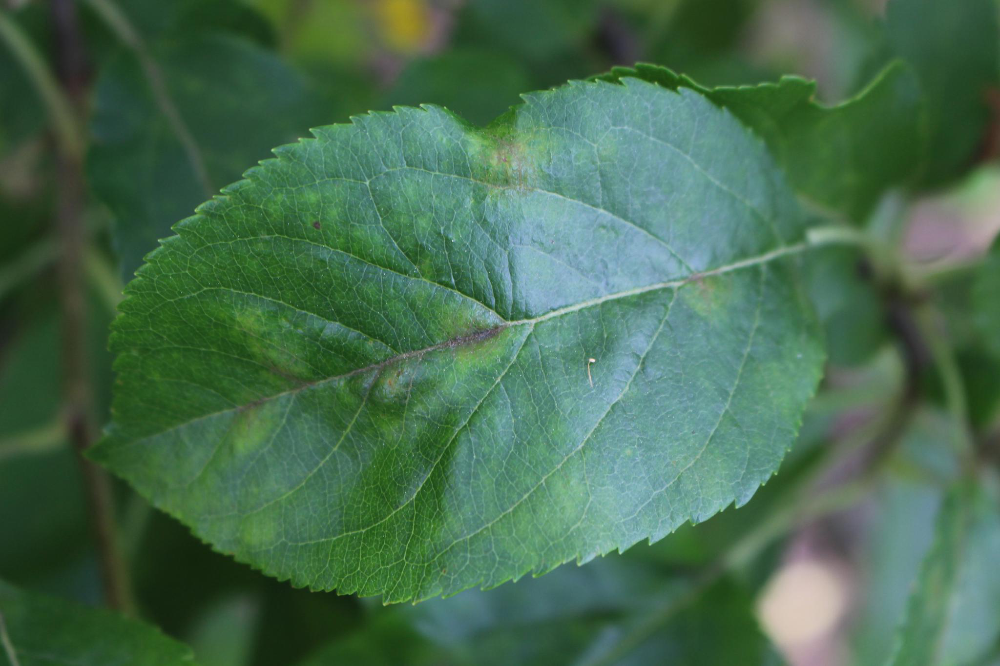

In [30]:
correct_with_normal_confidence = correct_predictions[correct_predictions_with_normal_confidence]
c = 0
for i in correct_with_normal_confidence.values:
    print("Predicted Class = "+ labels[i[5]] + ", Actual Class = "+labels[i[6]])
    display.display(Image.open(os.path.join('images', i[0]+'.jpg')))
    break

# My Observation

The leaves which are spotless and green, were marked as Healthy

The leaves which were having brownish midrib and brown patches were marked as Scab

The leaves which were having orange yellow spots were marked as Rust

The leaves which had the combination of brown patches and orange yellow spots were marked as Multiple Disease

# The Conditions were the model failed to predict

As per my observations, the cases were the leaf appeared to be almost spotless or had very small spots was classified as healthy

In other cases, the model is predicting the multiple diseased leaves as either rust or scab. Its predicting the more dominant symptom.